## Исследование данных и подбор параметров классификатора

#### Стек: ML: sklearn, pandas, numpy API: flask Данные: с kaggle - 
https://www.kaggle.com/teejmahal20/airline-passenger-satisfaction?select=train.csv
### Задача: определить вероятность удовлетворенности . Бинарная классификация. 
Используемые признаки:
Преобразование признаков:
Модель:

Данный набор данных представляет собой опрос удовлетворенности авиапассажиров. 
#### Обзорный анализ выбранного датасета
##### Объективные признаки:
Gender - пол (object) \
Customer Type - тип клиента {лояльный/ нелояльный} (object)\
Age - возраст (int64)\
Type of Travel - тип путешествия{личное/деловое}(object)\
Class - класс путешествия {Бизнес/эконом/эконом-плюс} (object)\
Flight Distance - расстояние полета (int64)\
##### Результаты опроса(измерений):
Inflight wifi service - удовлетворенность сервисом Wi-Fi (0-5) (int64)\
Departure/Arrival time convenient - уровень удовлетворенности временем отправления/прибытия (int64)\
Ease of Online booking - простота онлайн-юронирования (int64)\
Gate location - расположение выхода на посадку (int64)\
Food and drink - Уровень удовлетворенность едой и напитками (int64)\
Online boarding - удовлетворенность онлайн регистрацией (int64)\
Seat comfort - удовлетворенность комфортом сидений(int64)\
Inflight entertainment - удовлетворенность развлечениями на борту (int64)\
On-board service - удовлетворенность обслуживания на борту (int64)\
Leg room service - место для ног (int64)\
Baggage handling - обработка багажа (int64)\
Checkin service - удовлетворенность услугой регистрации (int64)\
Inflight service - удовлетворенность бортовым сервисом (int64)\
Cleanliness - чистота(int64)\
Departure Delay in Minutes - задержка отправления рейса в минутах (int64)\
Arrival Delay in Minutes - задержка прибытия в минутах (float64)\
##### Целевая переменная:
satisfaction - Удовлетворенность авиакомпанией {нейтральность или неудовлетворенность} (object)\


В датасете имеются 22 признаков и 1 целевая переменная - нужно определить удовлетворенность пассажира.

In [1]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np 
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

import xgboost as xgb
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import f1_score, roc_auc_score, precision_score, classification_report, precision_recall_curve, confusion_matrix

from sklearn.feature_selection import SelectKBest

import warnings
warnings.filterwarnings('ignore')

In [3]:
TRAIN_DATASET_PATH = '/Users/annasmejoukha/Desktop/ML_Business/project/datasets/train.csv' 

In [4]:
train_df = pd.read_csv(TRAIN_DATASET_PATH)
train_df.head(2)

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied


In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         103904 non-null  int64  
 1   id                                 103904 non-null  int64  
 2   Gender                             103904 non-null  object 
 3   Customer Type                      103904 non-null  object 
 4   Age                                103904 non-null  int64  
 5   Type of Travel                     103904 non-null  object 
 6   Class                              103904 non-null  object 
 7   Flight Distance                    103904 non-null  int64  
 8   Inflight wifi service              103904 non-null  int64  
 9   Departure/Arrival time convenient  103904 non-null  int64  
 10  Ease of Online booking             103904 non-null  int64  
 11  Gate location                      1039

In [6]:
train_df.describe()

,Unnamed: 0,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103594.000000
mean,51951.500000,64924.210502,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.178678
std,29994.645522,37463.812252,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.698682
min,0.000000,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25975.750000,32533.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,51951.500000,64856.500000,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,77927.250000,97368.250000,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,103903.000000,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


Заметим, что признаки 'Unnamed: 0' и 'id' не имеют особого значения в качестве информации, следовательно можно их исключить при дальнейшей работе с датасетом.
Наибольшие отклонения можно заметить для признака 'Flight Distance' дальность полета.

#### Обработка и отбор признаков

In [7]:
# Пропущенные значения
train_df.isnull().sum()

Unnamed: 0                             0
id                                     0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             310
satisfaction    

In [8]:
# соотношение классов целевой переменной
train_df['satisfaction'].value_counts()

neutral or dissatisfied    58879
satisfied                  45025
Name: satisfaction, dtype: int64

Заменим значения целевой переменной на 0 и 1 

In [9]:
train_df.satisfaction = np.where(train_df.satisfaction == 'satisfied', 1, 0)
train_df.satisfaction.value_counts()

0    58879
1    45025
Name: satisfaction, dtype: int64

Заменим значения для следующих признаков:
'Gender' (Male = 1, Female = 0)
'Customer Type' (Loyal = 1, disloyal = 0)
'Type of Travel' ( Business = 1, Personal = 0)

In [10]:
train_df['Gender'] = np.where(train_df['Gender'] == 'Male', 1, 0)
train_df['Gender'].value_counts()

0    52727
1    51177
Name: Gender, dtype: int64

In [11]:
train_df['Customer Type'] = np.where(train_df['Customer Type'] == 'Loyal Customer', 1, 0)
train_df['Customer Type'].value_counts()

1    84923
0    18981
Name: Customer Type, dtype: int64

In [12]:
train_df['Type of Travel'] = np.where(train_df['Type of Travel'] == 'Business travel', 1, 0)
train_df['Type of Travel'].value_counts()

1    71655
0    32249
Name: Type of Travel, dtype: int64

In [13]:
for col in train_df.columns[1:]:
    print(f'{col}\n{train_df[col].value_counts()}')
    print('*' * 30)

id
4098      1
19036     1
123497    1
125544    1
103015    1
         ..
60471     1
58422     1
64565     1
62516     1
4094      1
Name: id, Length: 103904, dtype: int64
******************************
Gender
0    52727
1    51177
Name: Gender, dtype: int64
******************************
Customer Type
1    84923
0    18981
Name: Customer Type, dtype: int64
******************************
Age
39    2969
25    2798
40    2574
44    2482
42    2457
      ... 
74      47
76      45
79      42
78      33
85      17
Name: Age, Length: 75, dtype: int64
******************************
Type of Travel
1    71655
0    32249
Name: Type of Travel, dtype: int64
******************************
Class
Business    49665
Eco         46745
Eco Plus     7494
Name: Class, dtype: int64
******************************
Flight Distance
337     660
594     395
404     392
2475    369
862     369
       ... 
1232      1
1116      1
988       1
1270      1
709       1
Name: Flight Distance, Length: 3802, dtype: int

##### Построим матрицу корреляции

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

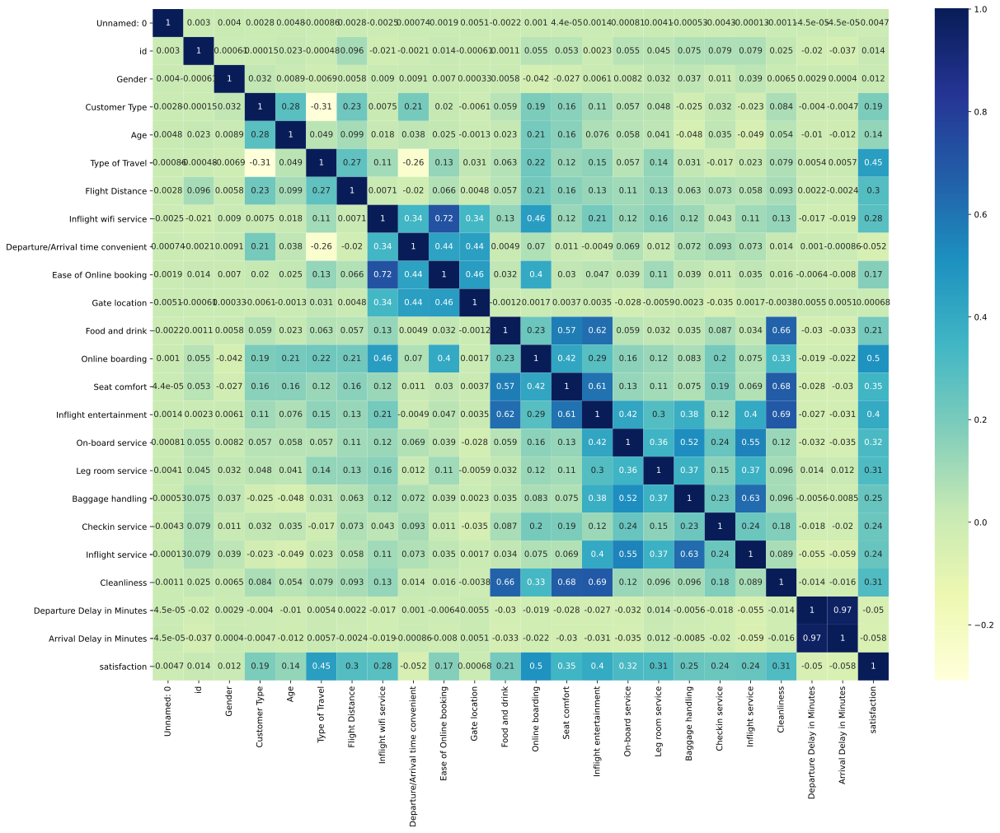

In [14]:
df_corr = train_df.iloc[:, 1:].corr()
plt.figure(figsize=(20,15))
sns.heatmap(train_df.corr(),annot=True,cmap='YlGnBu')
plt.tight_layout

Из начальной матрицы корреляции можно заметить наличие трех подгрупп, коррелируемых между собой признаков, отражающих параметры полета: 
##### 1 подгруппа (Pre-airport service): 'Inflight wifi service', 'Departure/Arrival time convenient', 'Ease of Online booking', 'Gate location'
##### 2 подгруппа (Comfort):'Food and drink','Online boarding', 'Seat comfort', 'Inflight entertainment'
##### 3 подгруппа (Board service):'Inflight entertainment', 'On-board service', 'Leg room service', 'Baggage handling'

In [15]:
plt.scatter(train_df['Departure Delay in Minutes'], train_df['Arrival Delay in Minutes'])
plt.xlabel('Departure Delay in Minutes')
plt.ylabel('Arrival Delay in Minutes')

Text(0, 0.5, 'Arrival Delay in Minutes')

Также заметна сильная корреляция между признаками 'Departure Delay in Minutes' и  'Arrival Delay in Minutes',что является логичным (задержка отправления зачастую приводит к задержке прибытия). Далее будем использовать только признак 'Departure Delay in Minutes'(задержка отправления рейса в минутах).

In [16]:
train_df['Pre-airport service'] = train_df[['Inflight wifi service','Departure/Arrival time convenient','Ease of Online booking', 'Gate location']].mean(axis=1)
train_df['Comfort'] = train_df[['Food and drink','Online boarding','Seat comfort', 'Inflight entertainment']].mean(axis=1)
train_df['Board Service'] = train_df[['Inflight entertainment','On-board service','Leg room service', 'Baggage handling']].mean(axis=1)
train_df.drop(['Inflight wifi service','Departure/Arrival time convenient','Ease of Online booking', 'Gate location', 'Food and drink','Online boarding','Seat comfort', 'Inflight entertainment', 'On-board service','Leg room service', 'Baggage handling', 'Arrival Delay in Minutes'],axis=1,inplace=True)

In [17]:
df_corr.satisfaction.sort_values()

Arrival Delay in Minutes            -0.057582
Departure/Arrival time convenient   -0.051601
Departure Delay in Minutes          -0.050494
Gate location                        0.000682
Gender                               0.012211
id                                   0.013734
Age                                  0.137167
Ease of Online booking               0.171705
Customer Type                        0.187638
Food and drink                       0.209936
Checkin service                      0.236174
Inflight service                     0.244741
Baggage handling                     0.247749
Inflight wifi service                0.284245
Flight Distance                      0.298780
Cleanliness                          0.305198
Leg room service                     0.313131
On-board service                     0.322383
Seat comfort                         0.349459
Inflight entertainment               0.398059
Type of Travel                       0.449000
Online boarding                   

In [18]:
cont_features = ['Age', 'Flight Distance', 'Departure Delay in Minutes', 'Arrival Delay in Minutes','Gender', 'Customer Type', 'Type of Travel']
cat_features = ['Class']

In [19]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 16 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Unnamed: 0                  103904 non-null  int64  
 1   id                          103904 non-null  int64  
 2   Gender                      103904 non-null  int64  
 3   Customer Type               103904 non-null  int64  
 4   Age                         103904 non-null  int64  
 5   Type of Travel              103904 non-null  int64  
 6   Class                       103904 non-null  object 
 7   Flight Distance             103904 non-null  int64  
 8   Checkin service             103904 non-null  int64  
 9   Inflight service            103904 non-null  int64  
 10  Cleanliness                 103904 non-null  int64  
 11  Departure Delay in Minutes  103904 non-null  int64  
 12  satisfaction                103904 non-null  int64  
 13  Pre-airport se

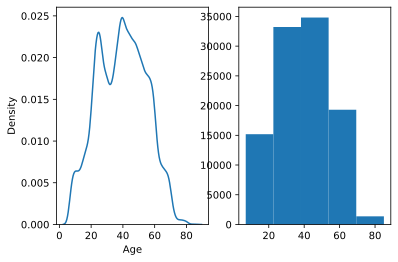

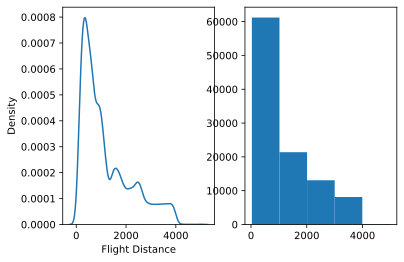

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
%config InlineBackend.figure_format = 'svg'

for column in cont_features[:2]:
    plt.subplot(1,2,1)
    sns.kdeplot(train_df[column])
    plt.subplot(1,2,2)
    plt.hist(train_df[column], bins=5)
    plt.show()

Применим к признаку "Age" преобразование QuantileTransformer

In [21]:
qt = QuantileTransformer(output_distribution='normal')

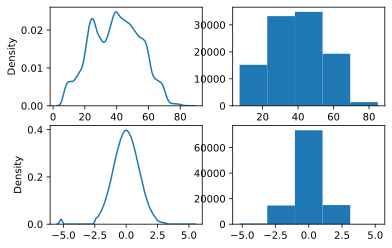

In [22]:
dq =qt.fit_transform(train_df['Age'].values.reshape(-1,1))
plt.subplot(2,2,1)
sns.kdeplot(train_df['Age'].values)
plt.subplot(2,2,2)
plt.hist(train_df['Age'], bins=5)
plt.subplot(2,2,3)
sns.kdeplot(dq[:,0])
plt.subplot(2,2,4)
plt.hist(dq, bins=5)
plt.show()

In [23]:
train_df['Age'] = qt.fit_transform(train_df['Age'].values.reshape(-1,1))

In [24]:
# Добавим dummies-переменные
train_df = pd.get_dummies(data=train_df, columns=cat_features)
train_df.head(2)

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Flight Distance,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,satisfaction,Pre-airport service,Comfort,Board Service,Class_Business,Class_Eco,Class_Eco Plus
0,0,70172,1,1,-1.744448,0,460,4,5,5,25,0,2.75,4.5,4.0,0,0,1
1,1,5047,1,0,-0.826698,1,235,1,4,1,1,0,2.75,1.5,2.5,1,0,0


Стандартизируем признак 'Fligth Distance'

In [25]:
standard = StandardScaler()

In [26]:
std_cols = standard.fit_transform(train_df[[cont_features[1]]])
std_cols[0]

array([-0.73153876])

In [27]:
train_df['Flight Distance'] = std_cols[:, 0]
train_df.head(2)

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Flight Distance,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,satisfaction,Pre-airport service,Comfort,Board Service,Class_Business,Class_Eco,Class_Eco Plus
0,0,70172,1,1,-1.744448,0,-0.731539,4,5,5,25,0,2.75,4.5,4.0,0,0,1
1,1,5047,1,0,-0.826698,1,-0.957184,1,4,1,1,0,2.75,1.5,2.5,1,0,0


In [28]:
ordered_features = ['Gender','Customer Type', 'Age', 'Type of Travel','Flight Distance', 'Checkin service', 'Inflight service', 'Cleanliness', 'Departure Delay in Minutes', 'Pre-airport service', 'Comfort', 'Board Service']
features_to_drop = ['satisfaction','Unnamed: 0', 'id']
target = ['satisfaction']

In [29]:
X = train_df.drop(features_to_drop, axis=1)
y = train_df[target]

In [30]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 15 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Gender                      103904 non-null  int64  
 1   Customer Type               103904 non-null  int64  
 2   Age                         103904 non-null  float64
 3   Type of Travel              103904 non-null  int64  
 4   Flight Distance             103904 non-null  float64
 5   Checkin service             103904 non-null  int64  
 6   Inflight service            103904 non-null  int64  
 7   Cleanliness                 103904 non-null  int64  
 8   Departure Delay in Minutes  103904 non-null  int64  
 9   Pre-airport service         103904 non-null  float64
 10  Comfort                     103904 non-null  float64
 11  Board Service               103904 non-null  float64
 12  Class_Business              103904 non-null  uint8  
 13  Class_Eco     

In [31]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.3, shuffle=True)

In [32]:
X_train.head(2)

,Gender,Customer Type,Age,Type of Travel,Flight Distance,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Pre-airport service,Comfort,Board Service,Class_Business,Class_Eco,Class_Eco Plus
81784,1,1,1.272478,0,-0.850880,4,3,4,0,3.50,3.25,3.5,0,1,0
79817,0,0,-1.194628,1,-0.821797,4,4,2,7,2.75,2.75,3.5,1,0,0


In [33]:
X_train.shape

(72732, 15)

### Поиск гиперпараметров

Используем XGBClassifier в качестве классификатора

In [34]:
xgb_cls = xgb.XGBClassifier(objective='binary:logistic', eval_metric='auc', random_state=27)

In [35]:
params={'n_estimators':[100, 150, 200, 250],
        'learning_rate':[0.1, 0.05, 0.01],
        'max_depth':[3, 5, 7, 10]
        }

In [36]:
%%time
grid = GridSearchCV(xgb_cls,
                    param_grid=params,
                    cv=7,
                    refit=False)

search = grid.fit(X_train, y_train)

CPU times: user 2h 15min 26s, sys: 9min 11s, total: 2h 24min 38s
Wall time: 21min 16s


In [37]:
search.best_params_

{'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 250}

In [38]:
search.best_score_

0.927734636618435

Обучение моедил классификатора

In [58]:
xgb_cls = xgb.XGBClassifier(objective='binary:logistic', eval_metric='auc', random_state=27,
            learning_rate=0.05, max_depth=10, n_estimators=250)

In [59]:
xgb_cls.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='auc',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.05, max_delta_step=0,
              max_depth=10, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=250, n_jobs=8,
              num_parallel_tree=1, random_state=27, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [60]:
valid_preds = xgb_cls.predict(X_valid)

In [61]:
print(f'Valid roc_auc_score: {roc_auc_score(y_valid, valid_preds)}')

Valid roc_auc_score: 0.9239689653060457


In [62]:
valid_proba = xgb_cls.predict_proba(X_valid)[:, 1]
valid_proba[:10]

array([0.01769719, 0.3745636 , 0.9993005 , 0.99980253, 0.9992243 ,
       0.03890425, 0.04470987, 0.05849392, 0.5699134 , 0.00557391],
      dtype=float32)

Строим матрицу ошибок и определяем оптимальный порог

In [63]:
precision, recall, thresholds = precision_recall_curve(y_valid, valid_proba)

fscore = (2 * precision * recall) / (precision + recall)
# locate the index of the largest f score
ix = np.argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f, Precision=%.3f, Recall=%.3f' % (thresholds[ix], 
                                                                        fscore[ix],
                                                                        precision[ix],
                                                                        recall[ix]))

Best Threshold=0.449994, F-Score=0.916, Precision=0.931, Recall=0.901


In [64]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[16833   896]
 [ 1330 12113]]


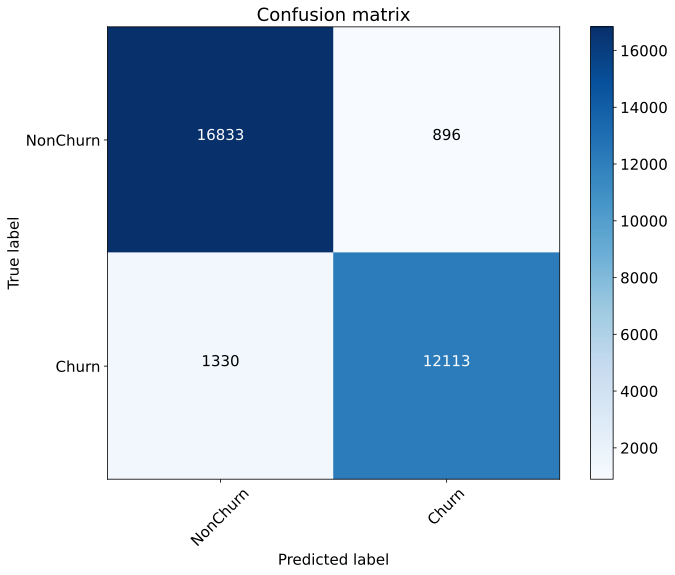

In [65]:
#мы уже нашли ранее "оптимальный" порог, когда максимизировали f_score
font = {'size' : 15}

plt.rc('font', **font)

cnf_matrix = confusion_matrix(y_valid, valid_proba>thresholds[ix])
plt.figure(figsize=(10, 8))
plot_confusion_matrix(cnf_matrix, classes=['NonChurn', 'Churn'],
                      title='Confusion matrix')
plt.savefig("conf_matrix.png")
plt.show()

### Важность признаков

In [66]:
xgb_coefs = pd.DataFrame(xgb_cls.feature_importances_, 
                        X_train.columns.to_list(), 
                        columns=['coefficient'])
xgb_coefs.head()

,coefficient
Gender,0.004428
Customer Type,0.081286
Age,0.009220
Type of Travel,0.075248
Flight Distance,0.004606


In [67]:
xgb_coefs.sort_values(by='coefficient', ascending=False)

,coefficient
Class_Business,0.634497
Customer Type,0.081286
Type of Travel,0.075248
Comfort,0.069792
Pre-airport service,0.029528
Board Service,0.026183
Checkin service,0.020630
Cleanliness,0.017143
Inflight service,0.014000
Age,0.009220


In [68]:
xgb_coefs.loc[xgb_coefs.coefficient == 0]

,coefficient


### Отбирем 12 наиболее важных признаков для обучения финальной модели

In [69]:
kbest = SelectKBest(k=12)

In [70]:
kbest.fit(X_train, y_train)

SelectKBest(k=12)

In [71]:
X_train_new = kbest.transform(X_train)

In [72]:
X_train_new.shape

(72732, 12)

In [73]:
xgb_cls.fit(X_train_new, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='auc',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.05, max_delta_step=0,
              max_depth=10, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=250, n_jobs=8,
              num_parallel_tree=1, random_state=27, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [74]:
X_valid_new = kbest.transform(X_valid)

In [75]:
valid_preds_new = xgb_cls.predict(X_valid_new)

In [76]:
roc_auc_score(y_valid, valid_preds_new)

0.9237637842306731

При сборке пайплайна применю следующие трансформации к признакам:

Flight Distance - стандартизация
Age - QuantileTransformer
'Gender', 'Customer Type', 'Type of Travel', 'Class' - One Hot Encoding
'Inflight wifi service', 'Ease of Online booking', 'Food and drink', 'Online boarding', 'Seat comfort', 'Inflight entertainment', 'On-board service', 'Leg room service', 'Baggage handling', 'Checkin service', 'Inflight service', 'Cleanliness' - оставляю без изменения
'id', 'Gate location', 'Departure/Arrival time convenient', 'Departure Delay in Minutes', 'Arrival Delay in Minutes' - не использую в обучении пайплайна